<h1>ENSO Teleconnections - RWS</h1>

![UFS-logo](../../../UFS-Logo-RGB-2csolidshorizontal-72dpi-min.png)

In [1]:
basedir = f'../../../..'

In [2]:
import os
import sys
import gc
import collections
import numpy as np
from io import BytesIO
from PIL import Image
import scipy
import xarray as xr
import matplotlib.pyplot as plt

# Point to root directory of repository
root_dir = os.path.join(os.getcwd(), basedir)
if root_dir not in sys.path:
    sys.path.insert(0, root_dir)

from src.datareader import datareader as dr
from src.regridder import Regrid
from src.util import oni, timeutil, stats

import warnings
warnings.filterwarnings('ignore')

<h3>User Configurables</h3>

In [3]:
ufs_experiment = 'baseline'

In [4]:
ufs_var = ['uprs', 'vprs']
verif_var = ['u_component_of_wind', 'v_component_of_wind']
lev = 200

In [5]:
time_range = ("1994-01-01", "2020-12-01")
initmonth = 11  # Only get this init within the time_range

# Form Composites around these leads.
# You could also specify a single lead, like, leads=1
leads = (0, 1, 2, 3)

In [6]:
# Scale variables for unit-matching
ufs_scaling_factor = 1
verif_scaling_factor = 1

In [7]:
# Define a region over which to calculate correlation
# You can ignore region by setting it to None
# region = None
region = {
    'latmin': -5.0,
    'latmax': 5.0,
    'lonmin': 190.0,
    'lonmax': 240.0
}

In [8]:
# Filter ONI events per specific criteria.
strength = None  # For example, you can set strength = 'Weak', 'Moderate', 'Strong', or 'Very Strong'
oni_threshold = None  # For example, you can set oni_threshold = 3

In [9]:
# Transform leads into a tuple used for slicing.
if isinstance(leads, int):
    leads = tuple([leads])

<h3>El Niño Events</h3>

In [10]:
oni.elnino_events  # These have been prerecorded

((1951, 1.2),
 (1952, 0.8),
 (1953, 0.8),
 (1957, 1.8),
 (1958, 0.6),
 (1963, 1.4),
 (1965, 1.9),
 (1968, 1.1),
 (1969, 0.9),
 (1972, 1.8),
 (1976, 0.9),
 (1977, 0.8),
 (1979, 0.6),
 (1982, 2.2),
 (1986, 1.2),
 (1987, 1.7),
 (1991, 1.7),
 (1994, 1.1),
 (1997, 2.4),
 (2002, 1.3),
 (2004, 0.7),
 (2006, 0.94),
 (2009, 1.36),
 (2014, 0.93),
 (2015, 2.64),
 (2018, 0.9),
 (2023, 1.95))

<h3>La Niña Events</h3>

In [11]:
oni.lanina_events  # These have been prerecorded

((1954, -0.9),
 (1955, -1.4),
 (1964, -0.8),
 (1970, -1.4),
 (1971, -0.9),
 (1973, -1.9),
 (1974, -0.8),
 (1975, -1.7),
 (1983, -0.9),
 (1984, -0.9),
 (1988, -1.8),
 (1995, -1.0),
 (1998, -1.6),
 (1999, -1.7),
 (2000, -0.7),
 (2005, -0.85),
 (2007, -1.64),
 (2008, -0.85),
 (2010, -1.64),
 (2011, -1.09),
 (2016, -0.69),
 (2017, -0.97),
 (2020, -1.27),
 (2021, -1.06),
 (2022, -0.99))

<h3>Create ONI objects for each event</h3>

In [12]:
ElNinos = [oni.ONI(event[0], event[1]) for event in oni.elnino_events]
LaNinas = [oni.ONI(event[0], event[1]) for event in oni.lanina_events]

In [13]:
elnino_strengths = [nino.get('strength') for nino in ElNinos]
lanina_strengths = [nina.get('strength') for nina in LaNinas]

In [14]:
collections.Counter(elnino_strengths)

Counter({'Weak': 11, 'Moderate': 7, 'Strong': 6, 'Very Strong': 3})

In [15]:
collections.Counter(lanina_strengths)

Counter({'Weak': 12, 'Strong': 7, 'Moderate': 6})

<h3>Get El Niño / La Niña years per specific criteria</h3>

In [16]:
# El Nino years
elnino_years = []
for nino in ElNinos:
    if strength is not None and nino.get('strength') != strength:
        continue      
    if oni_threshold is not None and nino.get('oni_magnitude') < oni_threshold:
        continue     
    elnino_years.append(nino.get('year'))

# La Nina
lanina_years = []
for nina in LaNinas:
    if strength is not None and nina.get('strength') != strength:
        continue      
    if oni_threshold is not None and nina.get('oni_magnitude') < oni_threshold:
        continue     
    lanina_years.append(nina.get('year'))
    
# Print El Nino years
print("Number of El Nino years: ", len(elnino_years))
for this_year in elnino_years:
    print(this_year, end=' ')
    
print('\n')

# Print La Nina years
print("Number of La Nina years: ", len(lanina_years))
for this_year in lanina_years:
    print(this_year, end=' ')
    

Number of El Nino years:  27
1951 1952 1953 1957 1958 1963 1965 1968 1969 1972 1976 1977 1979 1982 1986 1987 1991 1994 1997 2002 2004 2006 2009 2014 2015 2018 2023 

Number of La Nina years:  25
1954 1955 1964 1970 1971 1973 1974 1975 1983 1984 1988 1995 1998 1999 2000 2005 2007 2008 2010 2011 2016 2017 2020 2021 2022 

In [17]:
# Our model data doesn't go back to year 1950, nor does it reach the present, so what years are remaining?

begin_year = int(time_range[0][0:4])
end_year = int(time_range[1][0:4])

elnino_years_in_data = [y for y in elnino_years if y >= begin_year and y <= end_year]
lanina_years_in_data = [y for y in lanina_years if y >= begin_year and y <= end_year]

print('El Nino in data:')
print(elnino_years_in_data)
print('')
print('La Nina in data:')
print(lanina_years_in_data)

El Nino in data:
[1994, 1997, 2002, 2004, 2006, 2009, 2014, 2015, 2018]

La Nina in data:
[1995, 1998, 1999, 2000, 2005, 2007, 2008, 2010, 2011, 2016, 2017, 2020]


In [18]:
# Construct a list of tuples, where each tuple is like (init, lead)
# This is used in the calc_composite_layers() function
elnino_exclude_initleads = []
lanina_exclude_initleads = []

for this_year in range(begin_year, end_year+1):
    this_init = np.datetime64(f'{this_year}-{str(initmonth).zfill(2)}-01')
    
    for this_lead in leads:

        if this_year not in elnino_years_in_data:
            elnino_exclude_initleads.append((this_init, this_lead))
            
        if this_year not in lanina_years_in_data:
            lanina_exclude_initleads.append((this_init, this_lead))

<h3>Read in datasets and do some preprocessing</h3>

In [19]:
# 1 indicator shall refer to VERIF data
data_reader1 = dr.getDataReader(datasource='ERA5')

No filename provided; deferring to default
Reading data from gs://gcp-public-data-arco-era5/ar/1959-2022-6h-512x256_equiangular_conservative.zarr


In [20]:
# 2 indicator shall refer to UFS data
data_reader2 = dr.getDataReader(datasource='UFS',                  
                                experiment = ufs_experiment,
                                # filename=f'experiments/phase_1/{ufs_experiment}/atm_monthly.zarr',                     
                                model='atm')

No filename provided; deferring to default
Reading data from s3://noaa-oar-sfsdev-pds/experiments/phase_1/baseline/atm_monthly.zarr


In [21]:
ds1 = data_reader1.retrieve(var=verif_var,
                            lev=lev)

In [22]:
ds2 = data_reader2.retrieve(var=ufs_var,
                            lev=lev,
                            time=time_range,
                            initmonths=initmonth,
                            lead=(min(leads), max(leads)),
                            ens_avg=True)

Taking Ensemble Average


In [23]:
# Ensure that temporal domains perfectly match.
ds1 = timeutil.match_time_to_leads(verif_ds=ds1,
                                   ufs_ds=ds2)

In [24]:
# Scale fields.
ds1 = ds1 * verif_scaling_factor                                                                          
ds2 = ds2 * ufs_scaling_factor

In [25]:
# Update datareaders with subsetted and scaled data.
data_reader1.update(ds=ds1)
data_reader2.update(ds=ds2)

Dataset updated.
Dataset updated.


<h5>Instantiate Regridder</h5>

In [26]:
regridder = Regrid.Regrid(data_reader1=data_reader1,                                                              
                          data_reader2=data_reader2,                                                            
                          method='linear')


Regrid Object initialized.

___Resample Instructions___
data_reader1 must be temporally resampled before spatially regridding.
Resample these data by running <RegridObj>.resample(var=<var>, lev=<lev>, time=<time_range>)
To see all variables available for resample, run <RegridObj>.resample_vars()

___Regrid Instructions___
Initialized the Regridder with method 'linear'
Input grid shape data_reader1 (ERA5_DataReader): lat 256, lon 512
Output grid shape data_reader2 (UFS_DataReader): lat 192, lon 384
Regrid these data by running <RegridObj>.regrid(var=<var>, lev=<lev>, time=<time_range>)
To see all variables available for regrid, run <RegridObj>.regrid_vars()

___Align Instructions___
data_reader1 can have its time coordinates converted to init+lead.
Lead resolution of the UFS dataset interpreted as monthly intervals.
Align these data by running <RegridObj>.align() (You may need to resample and/or regrid first.)



In [27]:
# Get u-v fields for the highest resolution grid.
vars_to_resample = verif_var
vars_to_regrid = list(globals()[f'data_reader{regridder.highres_grid}'].dataset().keys())
print(f'will resample {vars_to_resample}')
print(f'will regrid {vars_to_regrid}')

will resample ['u_component_of_wind', 'v_component_of_wind']
will regrid ['u_component_of_wind', 'v_component_of_wind']


In [28]:
# RESAMPLE.  (Give this a few minutes to complete.)
regridder.resample(var=vars_to_resample)

Resampling data_reader1 data to 'MS' using mean aggregation.
Resampling from 1994-11-01T00 to 2021-02-28T18
Number of cores available: 8
Finished multiprocessing.  Concatenating results.
Resample completed in 8.6 minutes.
Resample results stored in <RegridObj>.resampled


In [29]:
# REGRID.
regridder.regrid(var=vars_to_regrid)

Regridding data_reader1 grid (ERA5_DataReader) onto data_reader2 grid (UFS_DataReader)
Running spherical harmonics on u_component_of_wind and v_component_of_wind
Completed sperical harmonics in 0.4 minutes.
Regrid results stored in <RegridObj>.regridded


In [30]:
# ALIGN.
regridder.align()

Aligning time coordinate to init+lead coordinates.
MODEL_LEADS: [0 1 2 3]
Time dimensions aligned:  matched 108 timesteps
Align results stored in <RegridObj>.aligned


In [31]:
# Datasets have been pre-processed.
# Need some logic here to extract the results.

# For these notebooks, we know that Verif data are aligned:
ds1 = regridder.aligned.dataset()

# UFS data could be in the regridded slot or not, depending on the experiment we're working with.
if regridder.highres_grid == 2:
    ds2 = regridder.regridded.dataset()
else:
    ds2 = data_reader2.dataset()

In [32]:
data_reader1.update(ds=ds1)
data_reader2.update(ds=ds2)

Dataset updated.
Dataset updated.


<h3>Ready for ONI calculations!</h3>

In [36]:
calculate_this = ['restoring effect', 'stationary wave number', 'rossby wave source']

ds1_elnino_statistics = stats.calc_composite_layers(data_reader=data_reader1,
                                                    var=verif_var,
                                                    statistics=calculate_this,
                                                    exclude_initleads=elnino_exclude_initleads)

ds1_lanina_statistics = stats.calc_composite_layers(data_reader=data_reader1,
                                                    var=verif_var,
                                                    statistics=calculate_this,
                                                    exclude_initleads=lanina_exclude_initleads)

ds2_elnino_statistics = stats.calc_composite_layers(data_reader=data_reader2,
                                                    var=ufs_var,
                                                    statistics=calculate_this,
                                                    exclude_initleads=elnino_exclude_initleads)

ds2_lanina_statistics = stats.calc_composite_layers(data_reader=data_reader2,
                                                    var=ufs_var,
                                                    statistics=calculate_this,
                                                    exclude_initleads=lanina_exclude_initleads)

Calculating restoring effect (Beta star) and stationary wave number (Ks)
Calculating Rossby Wave Source (RWS) components.
Calculating RWS component climatology statistics and anomalies.
restoring effect, stationary wave number, rossby wave source calculations finished.
Calculating restoring effect (Beta star) and stationary wave number (Ks)
Calculating Rossby Wave Source (RWS) components.
Calculating RWS component climatology statistics and anomalies.
restoring effect, stationary wave number, rossby wave source calculations finished.
Calculating restoring effect (Beta star) and stationary wave number (Ks)
Calculating Rossby Wave Source (RWS) components.
Calculating RWS component climatology statistics and anomalies.
restoring effect, stationary wave number, rossby wave source calculations finished.
Calculating restoring effect (Beta star) and stationary wave number (Ks)
Calculating Rossby Wave Source (RWS) components.
Calculating RWS component climatology statistics and anomalies.
rest

<p>
---------------------------------------------------------------<br>
We now have 4 datasets of statistics:<br>
<br>
ds1_elnino_statistics<br>
ds1_lanina_statistics<br>
ds2_elnino_statistics<br>
ds2_lanina_statistics<br>
---------------------------------------------------------------
</p>

<h3>Run t-tests</h3>

In [37]:
ds1_elnino_statistics = ds1_elnino_statistics.squeeze(dim=['lev'])
ds1_lanina_statistics = ds1_lanina_statistics.squeeze(dim=['lev'])
ds2_elnino_statistics = ds2_elnino_statistics.squeeze(dim=['lev'])
ds2_lanina_statistics = ds2_lanina_statistics.squeeze(dim=['lev'])

In [38]:
# Get position of init and lead axes
dims = list(ds1_elnino_statistics['beta_star'].dims) 
ttest_axes = []
if 'init' in dims:
    ttest_axes.append(dims.index("init"))
if 'lead' in dims:
    ttest_axes.append(dims.index("lead"))

In [39]:
# EL NINO
beta_star_tstatistic_elnino, beta_star_pvalue_elnino =\
    scipy.stats.ttest_ind(a=ds1_elnino_statistics['beta_star'].values,
                          b=ds2_elnino_statistics['beta_star'].values,
                          axis=ttest_axes,
                          alternative='two-sided')

Ks_tstatistic_elnino, Ks_pvalue_elnino =\
    scipy.stats.ttest_ind(a=ds1_elnino_statistics['Ks'].values,
                          b=ds2_elnino_statistics['Ks'].values,
                          axis=ttest_axes,
                          alternative='two-sided')

rws_tstatistic_elnino, rws_pvalue_elnino =\
    scipy.stats.ttest_ind(a=ds1_elnino_statistics['rws'].values,
                          b=ds2_elnino_statistics['rws'].values,
                          axis=ttest_axes,
                          alternative='two-sided')

# LA NINA
beta_star_tstatistic_lanina, beta_star_pvalue_lanina =\
    scipy.stats.ttest_ind(a=ds1_lanina_statistics['beta_star'].values,
                          b=ds2_lanina_statistics['beta_star'].values,
                          axis=ttest_axes,
                          alternative='two-sided')

Ks_tstatistic_lanina, Ks_pvalue_lanina =\
    scipy.stats.ttest_ind(a=ds1_lanina_statistics['Ks'].values,
                          b=ds2_lanina_statistics['Ks'].values,
                          axis=ttest_axes,
                          alternative='two-sided')

rws_tstatistic_lanina, rws_pvalue_lanina =\
    scipy.stats.ttest_ind(a=ds1_lanina_statistics['rws'].values,
                          b=ds2_lanina_statistics['rws'].values,
                          axis=ttest_axes,
                          alternative='two-sided')

<h5>Package statistics</h5>

In [40]:
p_values = xr.Dataset(
    data_vars={
        'beta_star_pvalue_elnino': (('lat', 'lon'), beta_star_pvalue_elnino),
        'Ks_pvalue_elnino': (('lat', 'lon'), Ks_pvalue_elnino),
        'rws_pvalue_elnino': (('lat', 'lon'), rws_pvalue_elnino),
        'beta_star_pvalue_lanina': (('lat', 'lon'), beta_star_pvalue_lanina),
        'Ks_pvalue_lanina': (('lat', 'lon'), Ks_pvalue_lanina),
        'rws_pvalue_lanina': (('lat', 'lon'), rws_pvalue_lanina)
        
    },
    coords={
        'lat': data_reader1.dataset().lat.values,
        'lon': data_reader1.dataset().lon.values
    }
)

<h1>Restoring Effect (Beta*)</h1>

In [41]:
# This is the DataArray for the Composite
ds1_elnino_composite = ds1_elnino_statistics['beta_star'].sel(lead=list(leads)).mean(['init', 'lead'])
ds1_lanina_composite = ds1_lanina_statistics['beta_star'].sel(lead=list(leads)).mean(['init', 'lead'])

ds2_elnino_composite = ds2_elnino_statistics['beta_star'].sel(lead=list(leads)).mean(['init', 'lead'])
ds2_lanina_composite = ds2_lanina_statistics['beta_star'].sel(lead=list(leads)).mean(['init', 'lead'])

# Calculate the difference in anomalies
elnino_ds2_minus_ds1 = ds2_elnino_composite - ds1_elnino_composite
lanina_ds2_minus_ds1 = ds2_lanina_composite - ds1_lanina_composite

# Scale Beta*
ds1_elnino_composite = ds1_elnino_composite / 1e-11
ds1_lanina_composite = ds1_lanina_composite / 1e-11
ds2_elnino_composite = ds2_elnino_composite / 1e-11
ds2_lanina_composite = ds2_lanina_composite / 1e-11
elnino_ds2_minus_ds1 = elnino_ds2_minus_ds1 / 1e-11
lanina_ds2_minus_ds1 = lanina_ds2_minus_ds1 / 1e-11

# Calculate Correlations
elnino_corr = xr.corr(ds1_elnino_composite, ds2_elnino_composite).values.item()
lanina_corr = xr.corr(ds1_lanina_composite, ds2_lanina_composite).values.item()

# Calculate Correlations over a smaller region
if region is not None:
    
    # latitudes are ordered 90 to -90
    lat_slice = slice(region['latmax'], region['latmin'])
    lon_slice = slice(region['lonmin'], region['lonmax'])
    
    elnino_corr_region = xr.corr(ds1_elnino_composite.sel(lat=lat_slice, lon=lon_slice),
                                 ds2_elnino_composite.sel(lat=lat_slice, lon=lon_slice)).values.item()
    
    lanina_corr_region = xr.corr(ds1_lanina_composite.sel(lat=lat_slice, lon=lon_slice),
                                 ds2_lanina_composite.sel(lat=lat_slice, lon=lon_slice)).values.item()

<h5>Make labels for the plots</h5>

In [42]:
elnino_event_years = list(ds1_elnino_statistics.groupby('init.year').groups.keys())
lanina_event_years = list(ds1_lanina_statistics.groupby('init.year').groups.keys())

# Convert every year into 'YY for compactness.
elnino_event_years = [f"'{str(y)[2:4]}" for y in elnino_event_years]
lanina_event_years = [f"'{str(y)[2:4]}" for y in lanina_event_years]

elnino_event_years = f"Events: {' '.join([f'{y}' for y in elnino_event_years])}"  # convert to string
lanina_event_years = f"Events: {' '.join([f'{y}' for y in lanina_event_years])}"  # convert to string

# Label for init and leads
initlead_label = f"init {initmonth}\nlead {' '.join(filter(str.isdigit, str(leads)))}"

# Label for correlation
elnino_corr_label = f'corr: {elnino_corr:.2f}'
lanina_corr_label = f'corr: {lanina_corr:.2f}'

if region is not None:
    elnino_corr_label = f'{elnino_corr_label}\nregion: {elnino_corr_region:.2f}'
    lanina_corr_label = f'{lanina_corr_label}\nregion: {lanina_corr_region:.2f}'

<h3>Generate figures</h3>

In [43]:
%%capture captured_output

# Instantiate buffers
buffer1 = BytesIO()
buffer2 = BytesIO()
buffer3 = BytesIO()
buffer4 = BytesIO()
buffer5 = BytesIO()
buffer6 = BytesIO()

# Make 6 plots
plot_kwargs = {'cmap_label': 'm-1 s-1 (1e-11)',
               'topleft_label': initlead_label,
               'region': region,
               'dpi': 200}

plot1 = stats.plot_composite(da = ds1_elnino_composite,
                             title=f'{data_reader1.datasource} BETA* lev={lev} (El Nino)',
                             vmin=-2, vmax=17, cmap='beta_star',
                             subtitle=elnino_event_years, **plot_kwargs)

plt.savefig(buffer1, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot2 = stats.plot_composite(da = ds1_lanina_composite,
                             title=f'{data_reader1.datasource} BETA* lev={lev} (La Nina)',
                             vmin=-2, vmax=17, cmap='beta_star',
                             subtitle=lanina_event_years, **plot_kwargs)

plt.savefig(buffer2, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot3 = stats.plot_composite(da = ds2_elnino_composite,
                             title=f'{data_reader2.datasource} BETA* lev={lev} (El Nino)',
                             vmin=-2, vmax=17, cmap='beta_star', 
                             subtitle=elnino_event_years, **plot_kwargs)

plt.savefig(buffer3, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot4 = stats.plot_composite(da = ds2_lanina_composite,
                             title=f'{data_reader2.datasource} BETA* lev={lev} (La Nina)',
                             vmin=-2, vmax=17, cmap='beta_star', 
                             subtitle=lanina_event_years, **plot_kwargs)

plt.savefig(buffer4, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot5 = stats.plot_composite(da = elnino_ds2_minus_ds1,
                             shading = p_values['beta_star_pvalue_elnino'],
                             shading_threshold = 0.05,
                             title=f'{data_reader2.datasource} minus {data_reader1.datasource} BETA* lev={lev} (El Nino)',
                             vmin=-3.5, vmax=3.5, cmap='beta_star_diff', 
                             subtitle=elnino_event_years,
                             bottomright_label=elnino_corr_label,
                             **plot_kwargs)

plt.savefig(buffer5, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot6 = stats.plot_composite(da = lanina_ds2_minus_ds1,
                             shading = p_values['beta_star_pvalue_lanina'],
                             shading_threshold = 0.05,
                             title=f'{data_reader2.datasource} minus {data_reader1.datasource} BETA* lev={lev} (La Nina)',
                             vmin=-3.5, vmax=3.5, cmap='beta_star_diff', 
                             subtitle=lanina_event_years,
                             bottomright_label=lanina_corr_label,
                             **plot_kwargs)

plt.savefig(buffer6, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------


<h3>Construct 3 row x 2 column multi-paneled image</h3>

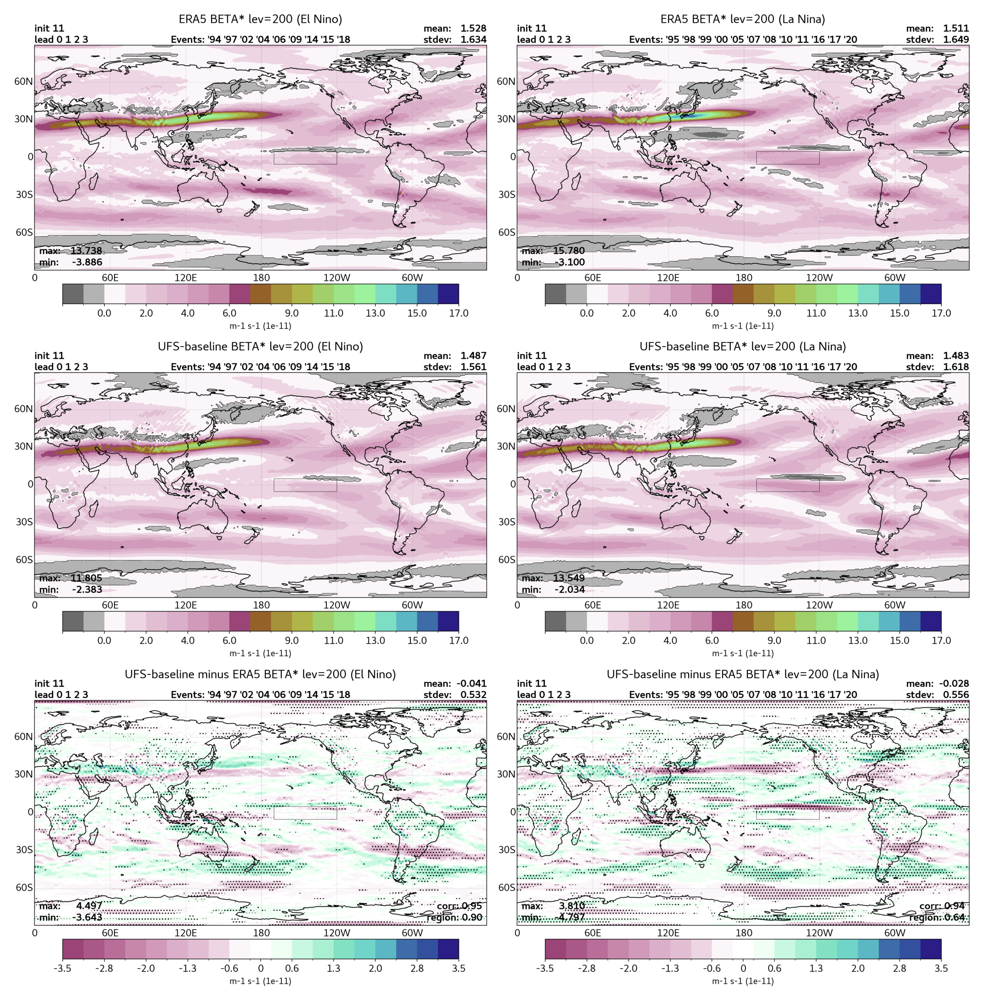

In [44]:
# Convert to images
image1 = Image.open(buffer1)
image2 = Image.open(buffer2)
image3 = Image.open(buffer3)
image4 = Image.open(buffer4)
image5 = Image.open(buffer5)
image6 = Image.open(buffer6)

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(11, 11), dpi=200)

axs[0, 0].imshow(image1)
axs[0, 0].axis('off')

axs[0, 1].imshow(image2)
axs[0, 1].axis('off')

axs[1, 0].imshow(image3)
axs[1, 0].axis('off')

axs[1, 1].imshow(image4)
axs[1, 1].axis('off')

axs[2, 0].imshow(image5)
axs[2, 0].axis('off')

axs[2, 1].imshow(image6)
axs[2, 1].axis('off')

plt.gca().set_frame_on(False)
plt.tight_layout(pad=.05)
plt.show()

<h1>Stationary Wave Number (Ks)</h1>

In [45]:
# This is the DataArray for the Composite
ds1_elnino_composite = ds1_elnino_statistics['Ks'].sel(lead=list(leads)).mean(['init', 'lead'])
ds1_lanina_composite = ds1_lanina_statistics['Ks'].sel(lead=list(leads)).mean(['init', 'lead'])

ds2_elnino_composite = ds2_elnino_statistics['Ks'].sel(lead=list(leads)).mean(['init', 'lead'])
ds2_lanina_composite = ds2_lanina_statistics['Ks'].sel(lead=list(leads)).mean(['init', 'lead'])

# Calculate the difference in anomalies
elnino_ds2_minus_ds1 = ds2_elnino_composite - ds1_elnino_composite
lanina_ds2_minus_ds1 = ds2_lanina_composite - ds1_lanina_composite

# Calculate Correlations
elnino_corr = xr.corr(ds1_elnino_composite, ds2_elnino_composite).values.item()
lanina_corr = xr.corr(ds1_lanina_composite, ds2_lanina_composite).values.item()

# Calculate Correlations over a smaller region
if region is not None:
    
    # latitudes are ordered 90 to -90
    lat_slice = slice(region['latmax'], region['latmin'])
    lon_slice = slice(region['lonmin'], region['lonmax'])
    
    elnino_corr_region = xr.corr(ds1_elnino_composite.sel(lat=lat_slice, lon=lon_slice),
                                 ds2_elnino_composite.sel(lat=lat_slice, lon=lon_slice)).values.item()
    
    lanina_corr_region = xr.corr(ds1_lanina_composite.sel(lat=lat_slice, lon=lon_slice),
                                 ds2_lanina_composite.sel(lat=lat_slice, lon=lon_slice)).values.item()

<h5>Make labels for plots</h5>

In [46]:
# Label for correlation
elnino_corr_label = f'corr: {elnino_corr:.2f}'
lanina_corr_label = f'corr: {lanina_corr:.2f}'

if region is not None:
    elnino_corr_label = f'{elnino_corr_label}\nregion: {elnino_corr_region:.2f}'
    lanina_corr_label = f'{lanina_corr_label}\nregion: {lanina_corr_region:.2f}'

In [47]:
%%capture captured_output

# Instantiate buffers
buffer1 = BytesIO()
buffer2 = BytesIO()
buffer3 = BytesIO()
buffer4 = BytesIO()
buffer5 = BytesIO()
buffer6 = BytesIO()

# Make 6 plots
plot_kwargs = {'cmap_label': 'm-2',
               'topleft_label': initlead_label,
               'region': region,
               'dpi': 200}

plot1 = stats.plot_composite(da = ds1_elnino_composite,
                             title=f'{data_reader1.datasource} Ks lev={lev} (El Nino)',
                             vmin=0, vmax=11, cmap='Ks',
                             subtitle=elnino_event_years, **plot_kwargs)

plt.savefig(buffer1, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot2 = stats.plot_composite(da = ds1_lanina_composite,
                             title=f'{data_reader1.datasource} Ks lev={lev} (La Nina)',
                             vmin=0, vmax=11, cmap='Ks',
                             subtitle=lanina_event_years, **plot_kwargs)

plt.savefig(buffer2, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot3 = stats.plot_composite(da = ds2_elnino_composite,
                             title=f'{data_reader2.datasource} Ks lev={lev} (El Nino)',
                             vmin=0, vmax=11, cmap='Ks',
                             subtitle=elnino_event_years, **plot_kwargs)

plt.savefig(buffer3, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot4 = stats.plot_composite(da = ds2_lanina_composite,
                             title=f'{data_reader2.datasource} Ks lev={lev} (La Nina)',
                             vmin=0, vmax=11, cmap='Ks',
                             subtitle=lanina_event_years, **plot_kwargs)

plt.savefig(buffer4, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot5 = stats.plot_composite(da = elnino_ds2_minus_ds1,
                             shading = p_values['Ks_pvalue_elnino'],
                             shading_threshold = 0.05,
                             title=f'{data_reader2.datasource} minus {data_reader1.datasource} Ks lev={lev} (El Nino)',
                             vmin=-4.5, vmax=4.5, cmap='Ks_diff',
                             subtitle=elnino_event_years,
                             bottomright_label=elnino_corr_label,
                             **plot_kwargs)

plt.savefig(buffer5, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot6 = stats.plot_composite(da = lanina_ds2_minus_ds1,
                             shading = p_values['Ks_pvalue_lanina'],
                             shading_threshold = 0.05,
                             title=f'{data_reader2.datasource} minus {data_reader1.datasource} Ks lev={lev} (La Nina)',
                             vmin=-4.5, vmax=4.5, cmap='Ks_diff',
                             subtitle=lanina_event_years,
                             bottomright_label=lanina_corr_label,
                             **plot_kwargs)

plt.savefig(buffer6, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------


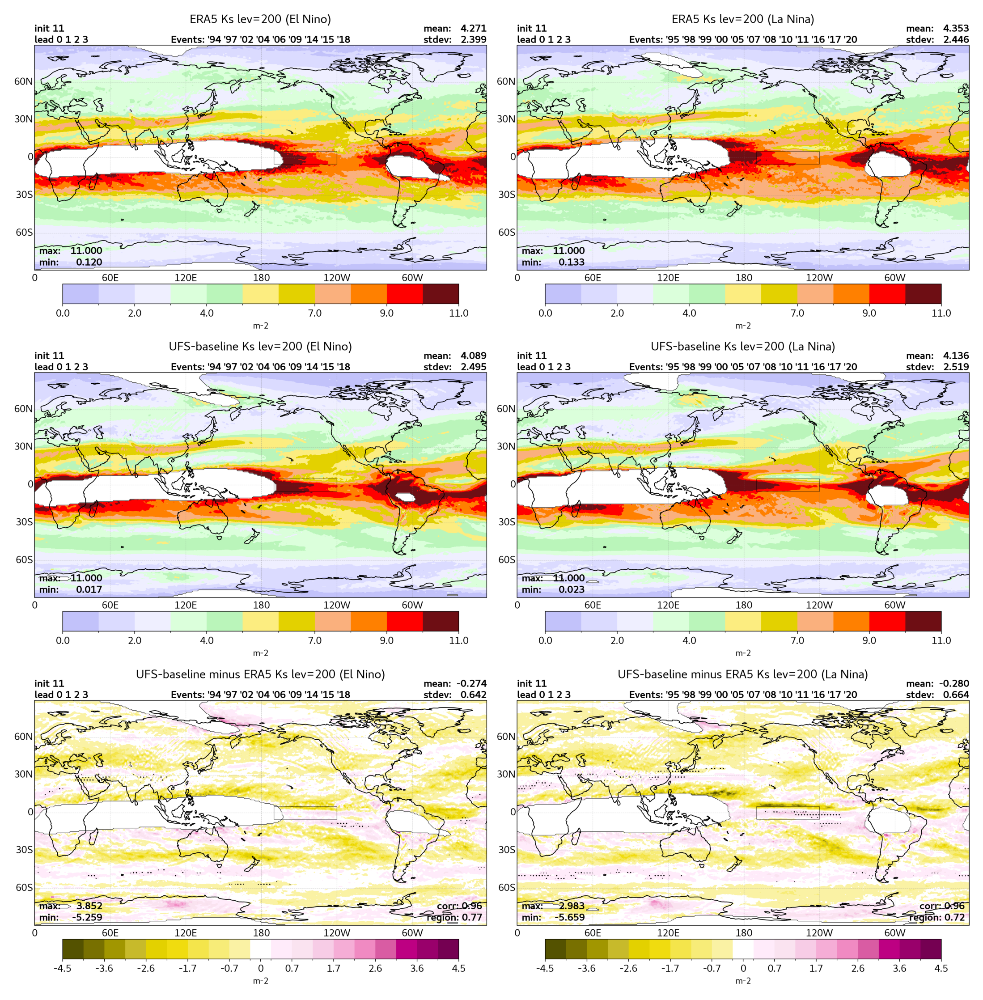

In [48]:
# Convert to images
image1 = Image.open(buffer1)
image2 = Image.open(buffer2)
image3 = Image.open(buffer3)
image4 = Image.open(buffer4)
image5 = Image.open(buffer5)
image6 = Image.open(buffer6)

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(11, 11), dpi=200)

axs[0, 0].imshow(image1)
axs[0, 0].axis('off')

axs[0, 1].imshow(image2)
axs[0, 1].axis('off')

axs[1, 0].imshow(image3)
axs[1, 0].axis('off')

axs[1, 1].imshow(image4)
axs[1, 1].axis('off')

axs[2, 0].imshow(image5)
axs[2, 0].axis('off')

axs[2, 1].imshow(image6)
axs[2, 1].axis('off')

plt.gca().set_frame_on(False)
plt.tight_layout(pad=.05)
plt.show()

<h1>Rossby Wave Source</h1>

In [49]:
# This is the DataArray for the Composite
ds1_elnino_composite = ds1_elnino_statistics['rws'].sel(lead=list(leads)).mean(['init', 'lead'])
ds1_lanina_composite = ds1_lanina_statistics['rws'].sel(lead=list(leads)).mean(['init', 'lead'])

ds2_elnino_composite = ds2_elnino_statistics['rws'].sel(lead=list(leads)).mean(['init', 'lead'])
ds2_lanina_composite = ds2_lanina_statistics['rws'].sel(lead=list(leads)).mean(['init', 'lead'])

# Calculate the difference in anomalies
elnino_ds2_minus_ds1 = ds2_elnino_composite - ds1_elnino_composite
lanina_ds2_minus_ds1 = ds2_lanina_composite - ds1_lanina_composite

# Scale Beta*
ds1_elnino_composite = ds1_elnino_composite / 1e-11
ds1_lanina_composite = ds1_lanina_composite / 1e-11
ds2_elnino_composite = ds2_elnino_composite / 1e-11
ds2_lanina_composite = ds2_lanina_composite / 1e-11
elnino_ds2_minus_ds1 = elnino_ds2_minus_ds1 / 1e-11
lanina_ds2_minus_ds1 = lanina_ds2_minus_ds1 / 1e-11

# Calculate Correlations
elnino_corr = xr.corr(ds1_elnino_composite, ds2_elnino_composite).values.item()
lanina_corr = xr.corr(ds1_lanina_composite, ds2_lanina_composite).values.item()

# Calculate Correlations over a smaller region
if region is not None:
    
    # latitudes are ordered 90 to -90
    lat_slice = slice(region['latmax'], region['latmin'])
    lon_slice = slice(region['lonmin'], region['lonmax'])
    
    elnino_corr_region = xr.corr(ds1_elnino_composite.sel(lat=lat_slice, lon=lon_slice),
                                 ds2_elnino_composite.sel(lat=lat_slice, lon=lon_slice)).values.item()
    
    lanina_corr_region = xr.corr(ds1_lanina_composite.sel(lat=lat_slice, lon=lon_slice),
                                 ds2_lanina_composite.sel(lat=lat_slice, lon=lon_slice)).values.item()

<h5>Make the labels for the plots</h5>

In [50]:
# Label for correlation
elnino_corr_label = f'corr: {elnino_corr:.2f}'
lanina_corr_label = f'corr: {lanina_corr:.2f}'

if region is not None:
    elnino_corr_label = f'{elnino_corr_label}\nregion: {elnino_corr_region:.2f}'
    lanina_corr_label = f'{lanina_corr_label}\nregion: {lanina_corr_region:.2f}'

In [51]:
%%capture captured_output

# Instantiate buffers
buffer1 = BytesIO()
buffer2 = BytesIO()
buffer3 = BytesIO()
buffer4 = BytesIO()
buffer5 = BytesIO()
buffer6 = BytesIO()

# Make 6 plots
plot_kwargs = {'cmap_label': 's-2 (1e-11)',
               'topleft_label': initlead_label,
               'region': region,
               'dpi': 200}

plot1 = stats.plot_composite(da = ds1_elnino_composite,
                             title=f'{data_reader1.datasource} RWS lev={lev} (El Nino)',
                             vmin=-15, vmax=15, cmap='rws',
                             subtitle=elnino_event_years, **plot_kwargs)

plt.savefig(buffer1, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot2 = stats.plot_composite(da = ds1_lanina_composite,
                             title=f'{data_reader1.datasource} RWS lev={lev} (La Nina)',
                             vmin=-15, vmax=15, cmap='rws',
                             subtitle=lanina_event_years, **plot_kwargs)

plt.savefig(buffer2, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot3 = stats.plot_composite(da = ds2_elnino_composite,
                             title=f'{data_reader2.datasource} RWS lev={lev} (El Nino)',
                             vmin=-15, vmax=15, cmap='rws',
                             subtitle=elnino_event_years, **plot_kwargs)

plt.savefig(buffer3, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot4 = stats.plot_composite(da = ds2_lanina_composite,
                             title=f'{data_reader2.datasource} RWS lev={lev} (La Nina)',
                             vmin=-15, vmax=15, cmap='rws',
                             subtitle=lanina_event_years, **plot_kwargs)

plt.savefig(buffer4, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot5 = stats.plot_composite(da = elnino_ds2_minus_ds1,
                             shading = p_values['rws_pvalue_elnino'],
                             shading_threshold = 0.05,
                             title=f'{data_reader2.datasource} minus {data_reader1.datasource} RWS lev={lev} (El Nino)',
                             vmin=-15, vmax=15, cmap='rws',
                             subtitle=elnino_event_years,
                             bottomright_label=elnino_corr_label,
                             **plot_kwargs)

plt.savefig(buffer5, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------

plot6 = stats.plot_composite(da = lanina_ds2_minus_ds1,
                             shading = p_values['rws_pvalue_lanina'],
                             shading_threshold = 0.05,
                             title=f'{data_reader2.datasource} minus {data_reader1.datasource} RWS lev={lev} (La Nina)',
                             vmin=-15, vmax=15, cmap='rws',
                             subtitle=lanina_event_years,
                             bottomright_label=lanina_corr_label,
                             **plot_kwargs)

plt.savefig(buffer6, format='png', bbox_inches='tight')
# -----------------------------------------------------------------------------


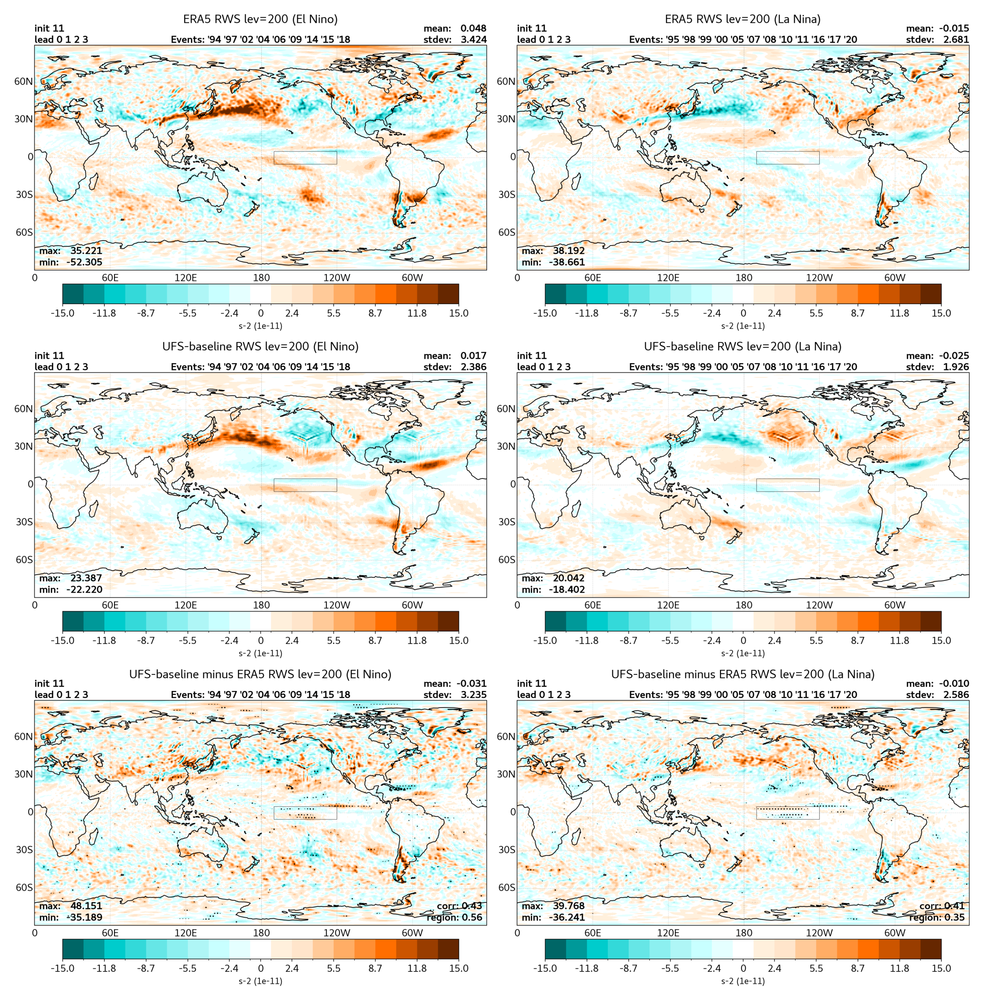

In [52]:
# Convert to images
image1 = Image.open(buffer1)
image2 = Image.open(buffer2)
image3 = Image.open(buffer3)
image4 = Image.open(buffer4)
image5 = Image.open(buffer5)
image6 = Image.open(buffer6)

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(11, 11), dpi=200)

axs[0, 0].imshow(image1)
axs[0, 0].axis('off')

axs[0, 1].imshow(image2)
axs[0, 1].axis('off')

axs[1, 0].imshow(image3)
axs[1, 0].axis('off')

axs[1, 1].imshow(image4)
axs[1, 1].axis('off')

axs[2, 0].imshow(image5)
axs[2, 0].axis('off')

axs[2, 1].imshow(image6)
axs[2, 1].axis('off')

plt.gca().set_frame_on(False)
plt.tight_layout(pad=.05)
plt.show()

In [53]:
del buffer1, buffer2, buffer3, buffer4, buffer5, buffer6
del image1, image2, image3, image4, image5, image6
del plot1, plot2, plot3, plot4, plot5, plot6, plt
gc.collect()

46930